# Assignment11
# Name : Junha Lee
# Student ID : 2017220159
# https://github.com/myosoo/Assignment11

# Import packages

In [1]:
import matplotlib.pyplot as plt
import numpy.matlib
import numpy as np
from scipy import signal
from skimage import io, color
from skimage import exposure
from scipy.sparse import coo_matrix, vstack, identity, linalg
from scipy.sparse.linalg import lsqr

# Convert matrix image to vector : 
$\begin{bmatrix}
a_{11} & a_{12} & a_{13} & \cdots & a_{1N} \\
a_{21} & a_{22} & a_{23} & \cdots & a_{2N} \\
a_{31} & a_{32} & a_{33} & \cdots & a_{3N} \\
\vdots & \vdots & \vdots & \ddots & \vdots \\
a_{M1} & a_{M2} & a_{M3} & \cdots & a_{MN}
\end{bmatrix} = \begin{bmatrix}
a_{11} \\
a_{21} \\
a_{31} \\
\vdots \\
a_{M1} \\
a_{12} \\
a_{22} \\
a_{32} \\
\vdots \\
a_{M2} \\
a_{1N} \\
a_{2N} \\
a_{3N} \\
\vdots \\
a_{MN} \\
\end{bmatrix}$



In [2]:
def image_vectorized(im):
    im_vectorized = im.flatten()
    return im_vectorized

# Difine horizontal diffrencing operations
# The shape of Dh is (M x (N - 1)) x (M x N) 

In [3]:
def Dh(M, N):
    Dh_row = np.empty((N - 1) * M * 2)
    Dh_col = np.empty(Dh_row.shape)
    operator = np.empty(Dh_row.shape)
    j = 0
    k = 0
    for i in range(M * (N - 1)):
        Dh_row[i] = i
        Dh_col[i] = j * N + k
        operator[i] = - 1
    
        Dh_row[M * (N - 1) + i] = i
        Dh_col[M * (N - 1) + i] = j * N + k + 1
        operator[M * (N - 1) + i] = 1
        k = k + 1
    
    Dh = coo_matrix((operator, (Dh_row, Dh_col)), shape = (M * (N - 1), M * N)) 
    return Dh

# Difine vertical diffrencing operations
# The shape of Dh is ((M - 1) x N) x (M x N) 

In [4]:
def Dv(M, N):
    Dv_row = np.empty((M - 1) * N * 2)
    Dv_col = np.empty(np.empty((M - 1) * N * 2).shape)
    operator = np.empty(Dv_row.shape)

    for i in range((M - 1) * N):
        Dv_row[i] = i
        Dv_col[i] = i
        operator[i] = - 1
    
        Dv_row[(M - 1) * N + i] = i
        Dv_col[(M - 1) * N + i] = i + N
        operator[(M - 1) * N + i] = 1
    
    Dv = coo_matrix((operator, (Dv_row, Dv_col)), shape = ((M - 1) * N, M * N))
    return Dv

# Make a cost function form to least square problem :
$\lVert {x-y} \lVert^2 + \lambda(\lVert {D_h{x}} \lVert^2 + \lVert {D_v{x}} \lVert^2)$ 
 
$\Longrightarrow \lVert Ax+b \lVert^2 = {\begin{Vmatrix}
{\begin{vmatrix}
I\\
\sqrt{\lambda}D_h{x}\\
\sqrt{\lambda}D_v{x}\\
\end{vmatrix}} -
{\begin{vmatrix}
y\\
0\\
0\\
\end{vmatrix}}
\end{Vmatrix}}^2$

In [5]:
def make_leastSquareProblem(lamb,input_image, M, N):
    dx, dy = np.sqrt(lamb) * Dh(M, N), np.sqrt(lamb) * Dv(M, N)
    
    img_vec = image_vectorized(input_image)
    img_len = len(img_vec)
    
    A = vstack([identity(M * N), dx, dy])
    b = np.zeros(img_len + dx.shape[0] + dy.shape[0])
    b[:img_len] = img_vec
    
    return (A,b)

# I used $\lambda = [10^{-5}, 0.5, 1, 10, 10^2]$ and $\sigma = [0.1, 0.2, 0.5, 1]$, The results are as follows

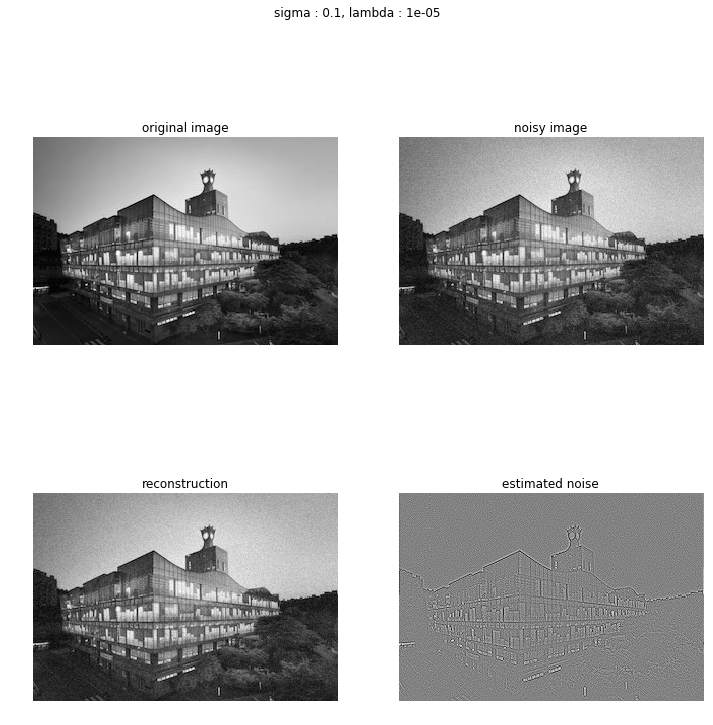

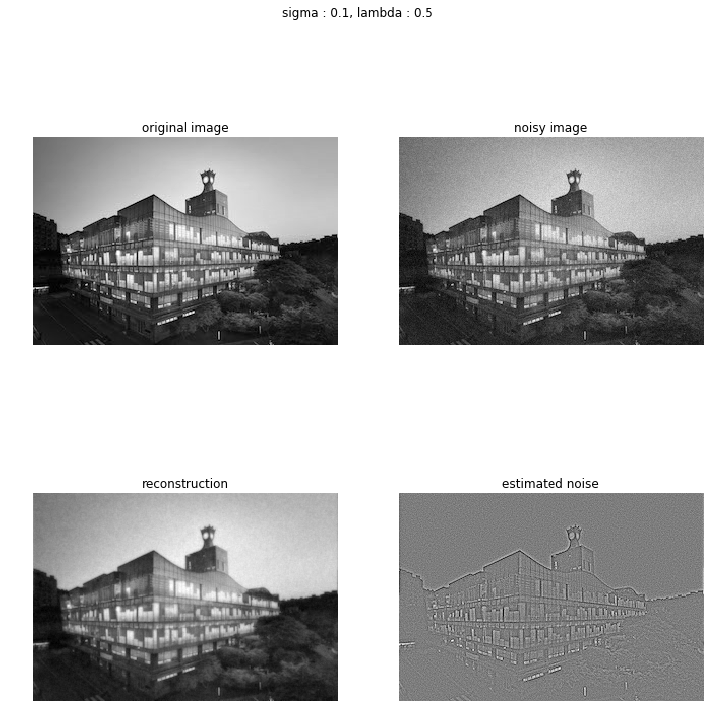

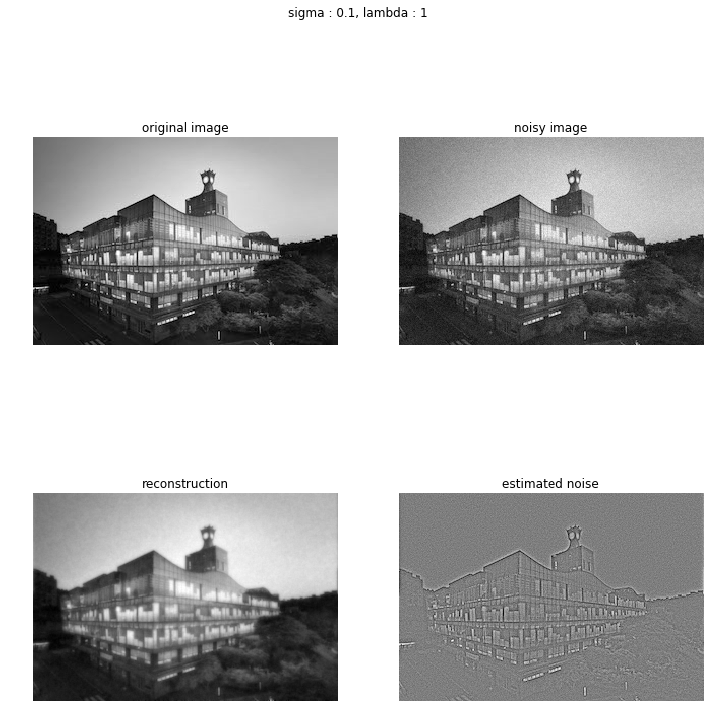

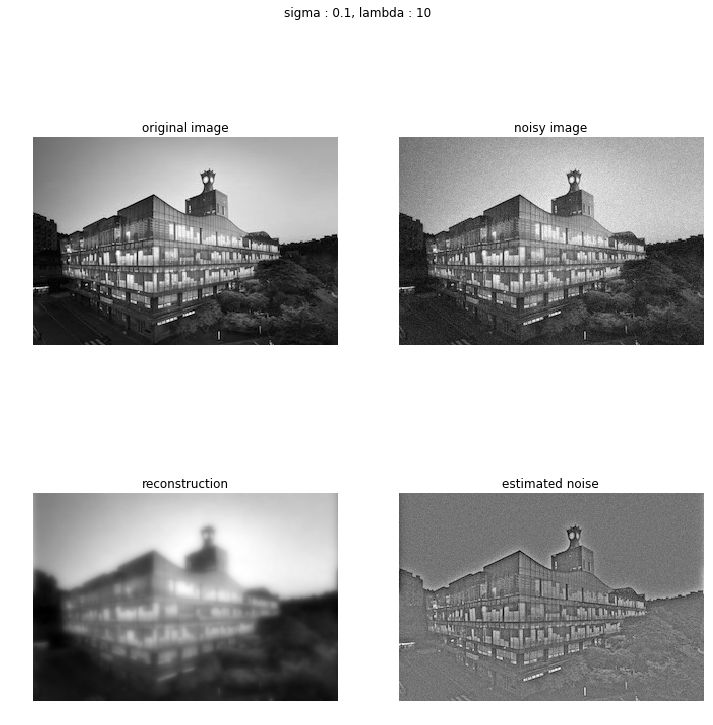

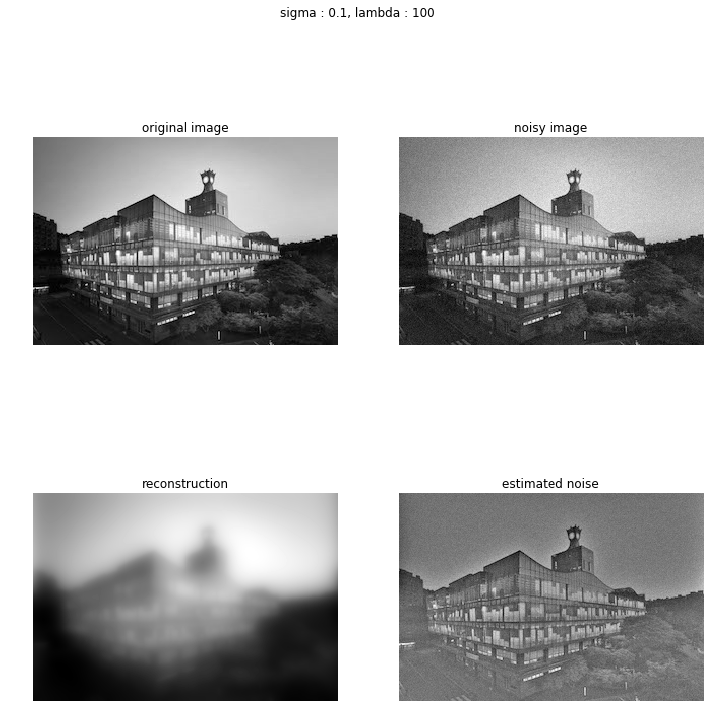

...

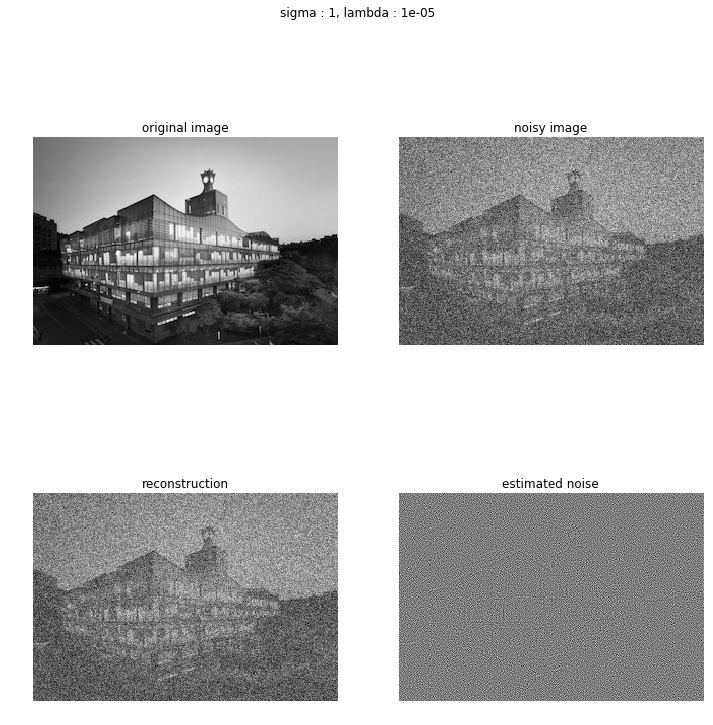

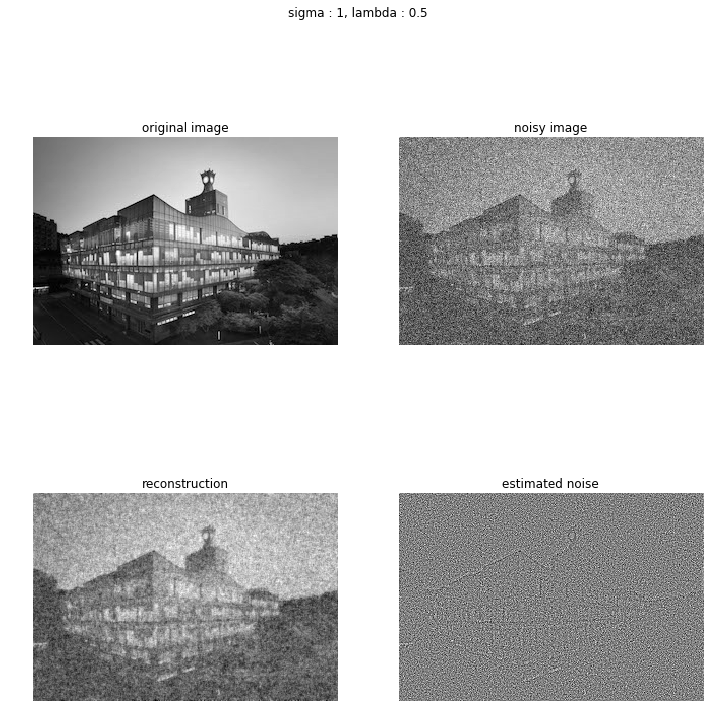

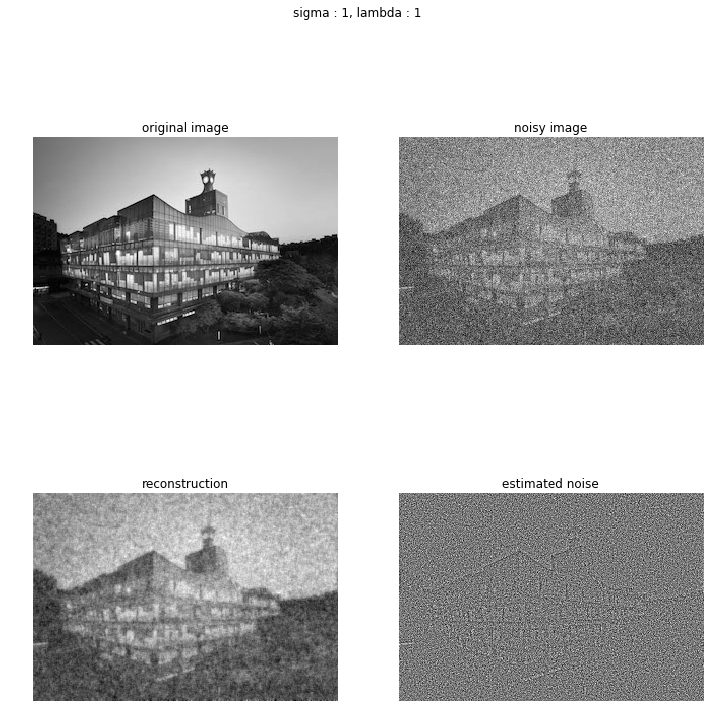

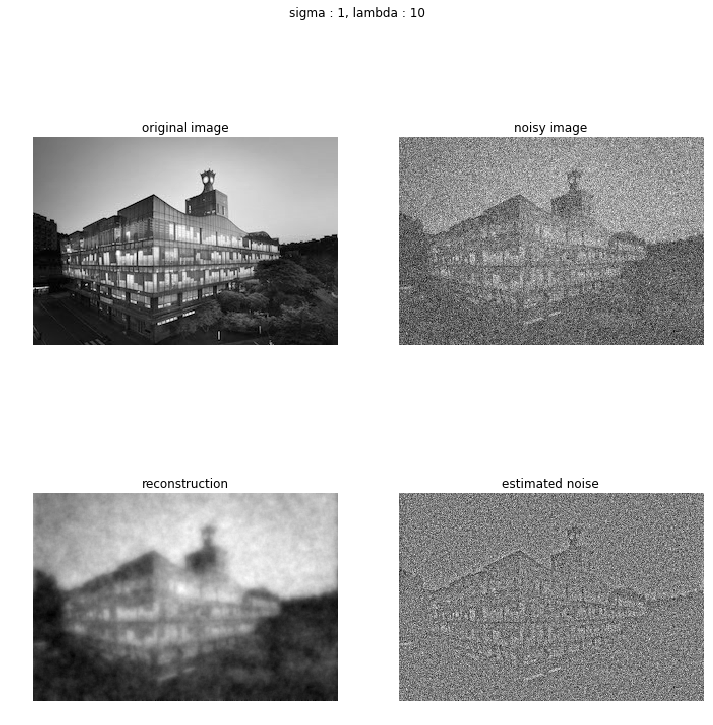

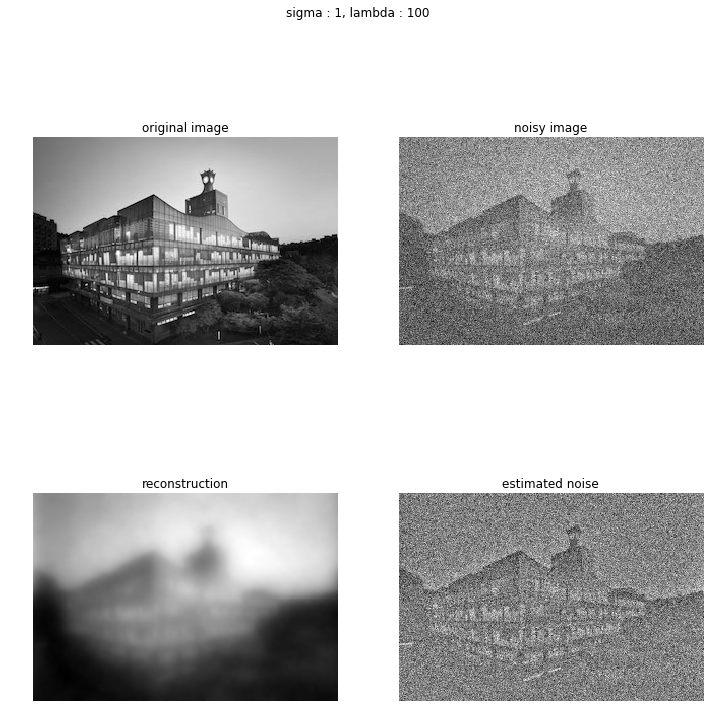

In [6]:
for sigma in [0.1, 0.2, 0.5, 1]:
    for lamb in [10 ** (-5), 0.5, 1, 10, 10 ** 2]:
        
        file_image = 'cau-1.jpg'

        im_color = io.imread(file_image)
        im_gray  = color.rgb2gray(im_color)
        im = (im_gray - np.mean(im_gray)) / np.std(im_gray)
        (row, col) = im.shape
        noise = np.random.normal(0, sigma, (row, col))
        
        im_noise    = im + noise
        
        im_noise = np.reshape(im_noise, (row*col, 1))
        (A, b) = make_leastSquareProblem(lamb, im_noise, row, col)
        
        (im_recon, istop, itn, r1norm, r2norm) = lsqr(A,b)[:5] # I used the library to calculate QR factorialization
        
        im_recon = np.reshape(im_recon, (row, col))
        im_noise = np.reshape(im_noise, (row, col))
        
        noise_recon = im_noise - im_recon
        error = np.linalg.norm(im - im_recon)
        
        fig = plt.figure(figsize = (12, 12))
        fig.suptitle('sigma : ' + str(sigma) + ", lambda : " + str(lamb))
        
        p1 = plt.subplot(2,2,1)
        p1.set_title('original image')
        plt.imshow(im, cmap='gray')
        plt.axis('off')

        p2 = plt.subplot(2,2,2)
        p2.set_title('noisy image')
        plt.imshow(im_noise, cmap='gray')
        plt.axis('off')

        p3 = plt.subplot(2,2,3)
        p3.set_title('reconstruction')
        plt.imshow(im_recon, cmap='gray')
        plt.axis('off')

        p4 = plt.subplot(2,2,4)
        p4.set_title('estimated noise')
        plt.imshow(noise_recon, cmap='gray')
        plt.axis('off')
        plt.show()